# ITK Spatial Image Filtering
#### CMPT 419 Spring 2025
*Do not share outside course* \
In this notebook, we will be using SimpleInsight Toolkit (SimpleITK) to open, filter, visualize and save a 3D Medical Image.
1. Start by creating a Python virtual environment using either `venv` or `conda`.
2. Depending on your environment, you can install the itk toolkit using either:
> pip install simpleitk \
> conda install -c conda-forge simpleitk

3. Using the same install method you used for SimpleITK, install `numpy` and `matplotlib`.
4. You are now ready to proceed with the notebook.

**Note**: Near the top of the notebook we define some helper functions. You may skip over the details of these, and focus on the implementation of spatial image filters below.

## Contents
The notebook below implements:
- Intensity Window (Window-Level) Filter
- Median Filter
- Mean Filter
- Histogram Equalization Filter
- Log Filter
- Gradient Magnitude
- Gradient Magnitude Recursive Gaussian Filter

For each of the provided filters, try adjusting the parameters and inspecting how the output changes. Also think of what problems each filter might solve, e.g. noise removal, edge detection, detail enhancement, etc..

## Data
This notebook uses "dicom.zip" from the Canvas datasets. Download the data from CMPT419 BLS1/Files/Practice/Datasets and unzip into a "data" directory as the Jupyter Notebook. Alternatively, you can alter the import paths in the code below

In [1]:
# Import the standard packages.
import numpy as np  # NumPy for numerical and array manipulations.
import matplotlib.pyplot as plt  # Matplotlib for visualizations.
from typing import Tuple, Union, Optional, List  # typing for type hints.
import os  # os for OS-related operations.

# Import Insight Toolkit.
import SimpleITK as sitk

## Load DICOM volume

In [2]:
# Function to load our dicom volume from slices in .dcm format
def load_dicom_volume_from_directory(dicom_directory):
    """
    Load a 3D DICOM volume from a directory containing DICOM slices
    Args:
        dicom_directory: str: Path to the directory containing DICOM slices
    Return:
        sitk.Image: 3D volume of slices, as a SimpleITK Image
    """
    # Check if the directory exists
    if not os.path.isdir(dicom_directory):
        raise FileNotFoundError(f"Directory {dicom_directory} does not exist")

    # Read the DICOM series
    reader = sitk.ImageSeriesReader()
    dicom_names = reader.GetGDCMSeriesFileNames(dicom_directory)
    if not dicom_names:
        raise FileNotFoundError(f"No DICOM series found in {dicom_directory}")
    print(f"Found {len(dicom_names)} DICOM slices")

    # Set the file names and execute the reader
    reader.SetFileNames(dicom_names)
    image = reader.Execute()

    # Print volume information
    size = image.GetSize()
    spacing = image.GetSpacing()
    origin = image.GetOrigin()

    print(f"Volume size: {size}")
    print(f"Volume spacing: {spacing}")
    print(f"Volume origin: {origin}")

    return image

In [10]:
# Path to the DICOM directory
dicom_dir = "./data/dicom/dicom_slices"

volume = load_dicom_volume_from_directory(dicom_dir)

Found 89 DICOM slices
Volume size: (512, 512, 89)
Volume spacing: (0.703125, 0.703125, 3.7499999545454545)
Volume origin: (-184.5, -180.0, -362.369995)


## Helper functions: Visualization
Here we define two functions to help visualize our data. You do not need to review or edit this code.

In [13]:
# Let's write a function which we can use to visualize the volume with matplotlib
def visualize_volume_slices(volume: sitk.Image,
                            num_slices: int=25,
                            rows: int=5,
                            cols: int=5,
                            middle_idx: int=None,
                            save_path: str=None,
                            title: str=None,
                            figsize: tuple=(15, 15)):
    """
    Args:
        volume: SimpleITK volume to visualize
        num_slices: Number of slices to display
        rows: Number of rows in the grid
        cols: Number of cols in the grid
        center_idx: Center slice idx (Optional)
        save_path: Path to save the visualization. If None, the figure is not saved
        title: Title for the figure
        figsize: Figure size in inches (width, height)
    Returns:
        fig: matplotlib.figure.Figure containing the visualization
    """
    volume_array = sitk.GetArrayFromImage(volume)
    # Get volume dimensions
    depth, height, width = volume_array.shape

    # Calculate start and end indices
    if middle_idx is None:
        middle_idx = depth // 2
    start_idx = middle_idx - (num_slices // 2)
    end_idx = start_idx + num_slices

    # Adjust if we are out of bounds (we're not, but it's good to check)
    if start_idx < 0:
        start_idx = 0
        end_idx = min(num_slices, depth)
    if end_idx > depth:
        end_idx = depth
        start_idx = max(0, end_idx - num_slices)

    # Create a figure with subplots for each slice
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten()

    # Determine global min and max values for consistent windowing
    min_val = np.min(volume_array[start_idx:end_idx])
    max_val = np.max(volume_array[start_idx:end_idx])

    # Plot each slice
    for i, slice_idx in enumerate(range(start_idx, end_idx)):
        if i < len(axes):
            ax = axes[i]
            ax.imshow(volume_array[slice_idx], cmap='gray', vmin=min_val, vmax=max_val)
            ax.set_title(f"Slice {slice_idx}")
            ax.axis('off')

    # Hide any unused subplots
    for i in range(end_idx - start_idx, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    # Add title if provided
    if title:
        fig.suptitle(title, fontsize=16, y=0.98)
        plt.subplots_adjust(top=0.92)

    # Save plot if a path is provided
    if save_path:
        plt.savefig(save_path, dpi=300)
    return fig

In [14]:
# Now let's write a function that will allow us to display differences between our original volume, and the filtered variations
def compare_original_with_filtered(original: sitk.Image,
                                   filtered: sitk.Image,
                                   num_slices: int=5,
                                   center_idx: Optional[int]=None,
                                   figsize: Tuple[int, int]=(15,12),
                                   cmap: str='gray',
                                   diff_cmap: str='coolwarm',
                                   diff_scaling: float=1.0,
                                   title: Optional[str]=None,
                                   save_path: Optional[str]=None,
                                   col_1_label: str = 'Original',
                                   col_2_label: str = 'Filtered') -> plt.Figure:
    """
    Compare original volume with filtered image and show the difference
    Args:
        original: Original DICOM volume
        filtered: Filtered DICOM volume
        num_slices: Number of slices to display
        center_idx: Center slice index. If None, the middle of the volume is used
        figsize: Figure size in inches (width, height)
        cmap: Colourmap for original and filtered images
        diff_cmap: Colourmap for the difference image
        diff_scaling: Scaling factor for difference visualization (higher values make subtle differences more visible)
        title: Title for the overall plot
        save_path: Path to save the figure. If None, the figure is not saved
        col_1_label: Label for first column of figure (default: Original)
        col_2_label: Label for second colum of figure (default: Filtered)
    Returns:
        fig: The figure containing the comparison
    """
    # Convert sitk.Image to numpy
    original_array = sitk.GetArrayFromImage(original)
    filtered_array = sitk.GetArrayFromImage(filtered)

    # Calculate difference
    difference_array = filtered_array - original_array

    # Get dimensions along z-axis
    depth = original_array.shape[0]

    # Determine which slices to show
    # Calculate center and surrounding slices (axial slices)
    if center_idx is None:
        center_idx = depth // 2

    start_idx = center_idx - (num_slices // 2)
    end_idx = start_idx + num_slices

    # Adjust if we are out of bounds (we're not, but it's good to check)
    if start_idx < 0:
        start_idx = 0
        end_idx = min(num_slices, depth)
    if end_idx > depth:
        end_idx = depth
        start_idx = max(0, end_idx - num_slices)

    # Create figure with 3 columns (original, filtered, difference) and num_slices rows
    fig, axes = plt.subplots(num_slices, 3, figsize=figsize)

    # For a single slice, axes might not be a 2D array
    if num_slices == 1:
        axes = axes.reshape(1, -1)

    # Common min/max for consistent display
    # Min / Max values for original array.
    o_min = np.min(original_array[start_idx:end_idx])
    o_max = np.max(original_array[start_idx:end_idx])
    # Min / Max values for filtered array
    f_min = np.min(filtered_array[start_idx:end_idx])
    f_max = np.max(filtered_array[start_idx:end_idx])
    # Min / Max values for difference array
    d_min = np.min(difference_array[start_idx:end_idx])
    d_max = np.max(difference_array[start_idx:end_idx])

    d_abs_max = np.maximum(np.abs(d_min), np.abs(d_max))

    # Create a symmetric range for difference colormap (centered at zero)
    d_range = (-d_abs_max / diff_scaling, d_abs_max / diff_scaling)

    im_objects = [None, None, None]
    # Plot each slice
    for i, slice_idx in enumerate(range(start_idx, end_idx)):
        if i < axes.shape[0]:
            # Original slice
            ax = axes[i, 0]
            im = ax.imshow(original_array[slice_idx], cmap=cmap, vmin=o_min, vmax=o_max)
            if i == 0:
                im_objects[0] = im
            ax.set_title(f"{col_1_label} Slice {slice_idx}")
            ax.axis('off')

            # Filtered slice
            ax = axes[i, 1]
            im = ax.imshow(filtered_array[slice_idx], cmap=cmap, vmin=f_min, vmax=f_max)
            if i == 0:
                im_objects[1] = im
            ax.set_title(f"{col_2_label} Slice {slice_idx}")
            ax.axis('off')

            # Difference
            ax = axes[i, 2]
            im = ax.imshow(difference_array[slice_idx], cmap=diff_cmap, vmin=d_range[0], vmax=d_range[1])
            if i == 0:
                im_objects[2] = im
            ax.set_title(f"Difference (x{diff_scaling:.1})")
            ax.axis('off')

    plt.tight_layout()

    # Adjust layout to make room for colourbars
    plt.subplots_adjust(right=0.9)

    # Add colourbars
    cbar_ax0 = fig.add_axes([0.92, 0.66, 0.02, 0.2])
    cbar_ax1 = fig.add_axes([0.92, 0.38, 0.02, 0.2])
    cbar_ax2 = fig.add_axes([0.92, 0.1, 0.02, 0.2])

    # Create colorbars with appropriate ranges
    cbar0 = fig.colorbar(im_objects[0], cax=cbar_ax0)
    cbar0.set_label(f'{col_1_label} Intensity')
    cbar0.mappable.set_clim(o_min, o_max)

    cbar1 = fig.colorbar(im_objects[1], cax=cbar_ax1)
    cbar1.set_label(f'{col_2_label} Intensity')
    cbar1.mappable.set_clim(f_min, f_max)

    cbar2 = fig.colorbar(im_objects[2], cax=cbar_ax2)
    cbar2.set_label(f'Difference (x{diff_scaling:.1f})')
    cbar2.mappable.set_clim(d_range[0], d_range[1])

    # Add title if provided
    if title:
        fig.suptitle(title, fontsize=16, y=0.98)
        plt.subplots_adjust(top=0.92)

    # Save figure if path provided
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')

    return fig

## Helper function: Add noise
In order to evaluate how some of the filters act on noisy data, here we define a function which adds Gaussian Noise. \
You do not need to review or edit this code

In [15]:
# Add noise to the original image, and try again to show how Gaussian smoothing improves result
def add_gaussian_noise(image: sitk.Image, mean: float = 0.0, std_dev: float = 25.0) -> sitk.Image:
    """
    Add Gaussian noise to a SimpleITK image.

    Args:
        image: Input SimpleITK image
        mean: Mean of the Gaussian noise
        std_dev: Standard deviation of the Gaussian noise

    Returns:
        SimpleITK image with added Gaussian noise
    """
    # Convert to numpy array for noise addition
    array = sitk.GetArrayFromImage(image)

    # Generate Gaussian noise
    noise = np.random.normal(mean, std_dev, array.shape).astype(array.dtype)

    # Add noise to the image
    noisy_array = array + noise

    # Convert back to SimpleITK image
    noisy_image = sitk.GetImageFromArray(noisy_array)
    noisy_image.CopyInformation(image)  # Preserve metadata

    return noisy_image

## Visualization of the DICOM volume, and inspection of image statistics
Let's display some slices to see what we are working with. We will show 25 axial slices from ~the middle of the volume. \
We will also print the range of voxel intensities in our DICOM volume, as well as the mean.

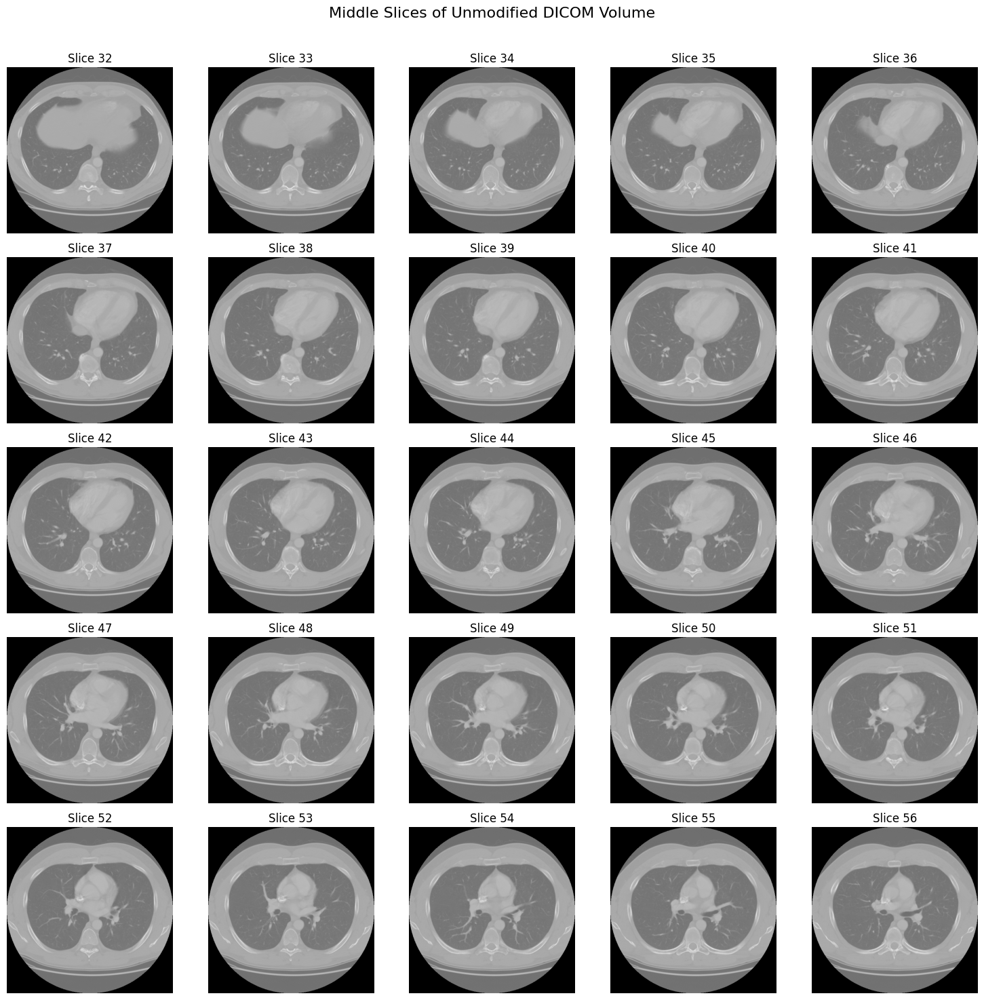

In [16]:
fig = visualize_volume_slices(volume=volume, title='Middle Slices of Unmodified DICOM Volume')
plt.show()

In [17]:
# Before applying any filtering, let's inspect the range and mean of input intensities in our data.
stats_filter = sitk.StatisticsImageFilter()

stats_filter.Execute(volume)
orig_vol_min_intensity = stats_filter.GetMinimum()
orig_vol_max_intensity = stats_filter.GetMaximum()
orig_vol_mean_intensity = stats_filter.GetMean()

# Let's also get the original datatype
voxel_datatype = volume.GetPixelIDTypeAsString()

print(f"Original DICOM Intensity range: [{orig_vol_min_intensity}, {orig_vol_max_intensity}]")
print(f"Original DICOM Mean Intensity: {orig_vol_mean_intensity}")
print(f"DICOM volume datatype: {voxel_datatype}")

Original DICOM Intensity range: [-33792.0, 31713.0]
Original DICOM Mean Intensity: -884.2362646038613
DICOM volume datatype: 32-bit signed integer


By inspection of our data volume, and the associated stats, we see that we are working with a 3D CT volume of the chest region. The axial slices we've displayed show the lungs (dark regions on the right and left), heart (large round structure in the center) and spinal column (intrusion towards the bottom of the image). The observed mean suggests that our data is recorded using Hounsfield Units, and is stored as signed int32.
## Intensity window filtering (Window-Level)
Our first step will be to apply intensity window (window-level) filtering to accentuate regions of interest. For this notebook, we will set parameters suitable for viewing the lungs.

In [18]:
def apply_intensity_windowing_filter(image: sitk.Image,
                                     window_centre: float = -600.0,
                                     window_width: float = 1500.0,
                                     output_min: float=0.0,
                                     output_max: float=255.0) -> sitk.Image:
    """
    Apply intensity windowing to a SimpleITK image
    Args:
        image: Input CT image to be windowed (in Hounsfield Units)
        window_centre: Center of the window in HU (default: -600 for lung CT)
        window_width: Width of the window in HU (default: 1500 for lung CT)
        output_min: Minimum output intensity value
        output_max: Maximum output intensity value
    Returns:
        sitk.Image: Intensity windowed image
    """
    # Create the intensity windowing filter
    window_filter = sitk.IntensityWindowingImageFilter()

    window_min = window_centre - window_width / 2
    window_max = window_centre + window_width / 2

    # Set filter parameters
    window_filter.SetWindowMinimum(window_min)
    window_filter.SetWindowMaximum(window_max)
    window_filter.SetOutputMinimum(output_min)
    window_filter.SetOutputMaximum(output_max)

    # Apply the filter
    windowed_image = window_filter.Execute(image)

    return windowed_image

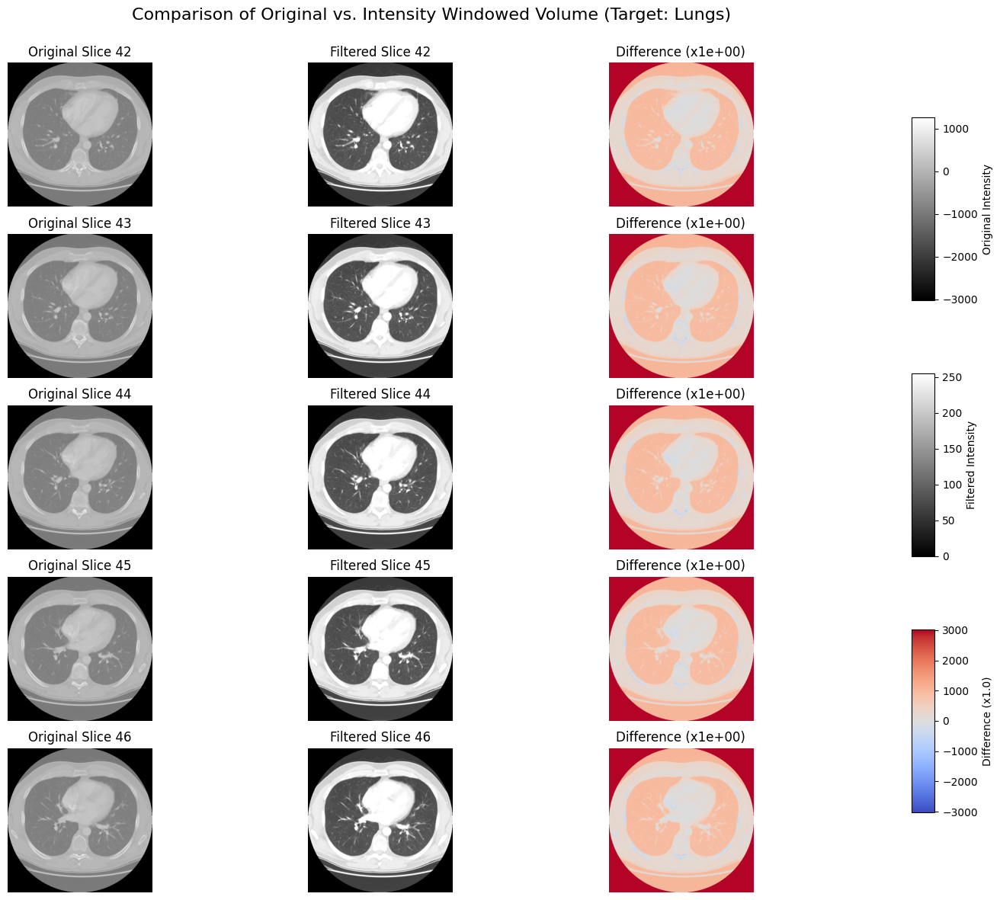

In [19]:
# Here are a few window parameters for different structures visible in our CT volume (window_center, window_width)
# We will use the lung intensity windowed volume for the rest of this notebook.
lung_windowing_params = (-600, 1500)
soft_tissue_windowing_params = (40, 400)
bone_windowing_params = (400, 1800)

# Apply the filter
intensity_windowed_volume_lung = apply_intensity_windowing_filter(volume,
                                                             window_centre=lung_windowing_params[0],
                                                             window_width=lung_windowing_params[1])

# Compare and visualize
compare_original_with_filtered(volume, intensity_windowed_volume_lung, num_slices=5, title='Comparison of Original vs. Intensity Windowed Volume (Target: Lungs)')

plt.show()

The large difference observed here is due to our conversion from signed int32 with range [-33792, 31713] to float values in range [0.0, 255.0]. \
We will use the shifted data throughout the rest of the notebook, as this will make it easier to perform certain filtering operations, such as log filter, which cannot handle negative values.

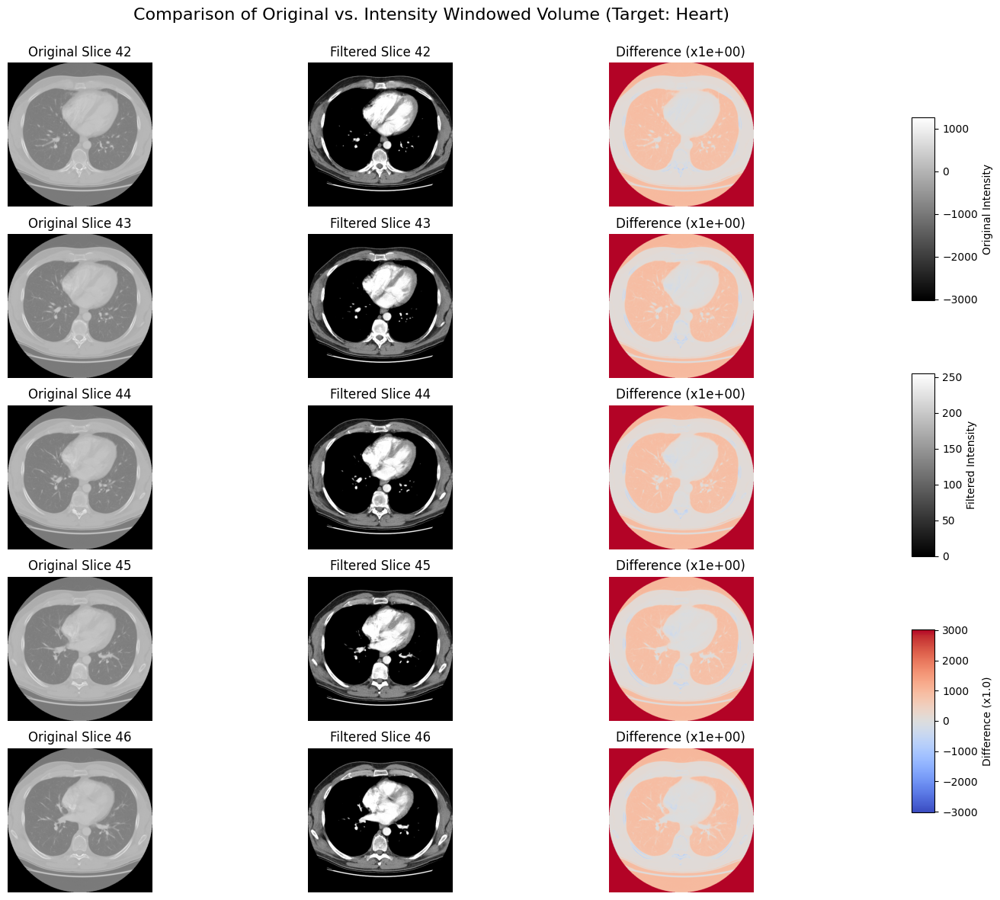

In [20]:
# Observe how we can improve the visibility of certain structures by adjusting our windowing parameters.
# Here we will improve detail on the heart (the round object in the center of the image)

# Apply the filter
intensity_windowed_volume_heart = apply_intensity_windowing_filter(volume,
                                                             window_centre=soft_tissue_windowing_params[0],
                                                             window_width=soft_tissue_windowing_params[1])

# Compare and visualize
compare_original_with_filtered(volume, intensity_windowed_volume_heart, num_slices=5, title='Comparison of Original vs. Intensity Windowed Volume (Target: Heart)')

plt.show()

## Intensity Window (Window-Level) Filtering (Comparison of Heart vs. Lungs)
Let's compare these two results from different Window-Level filtering operations

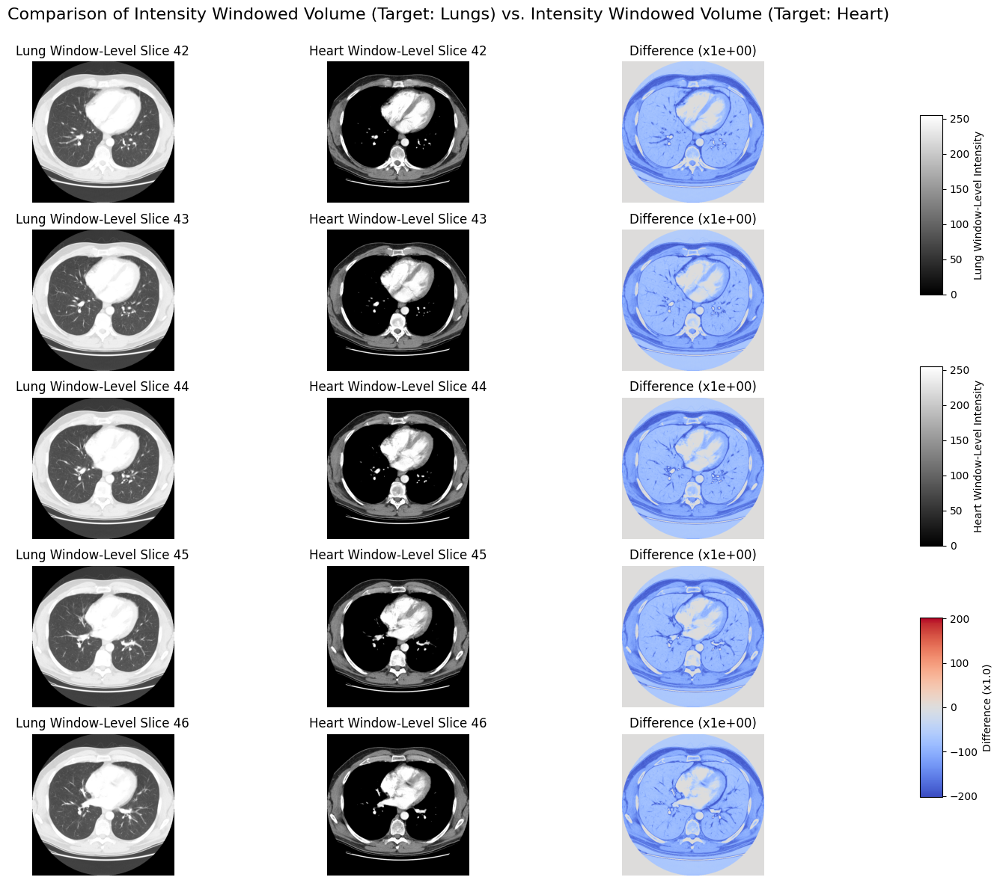

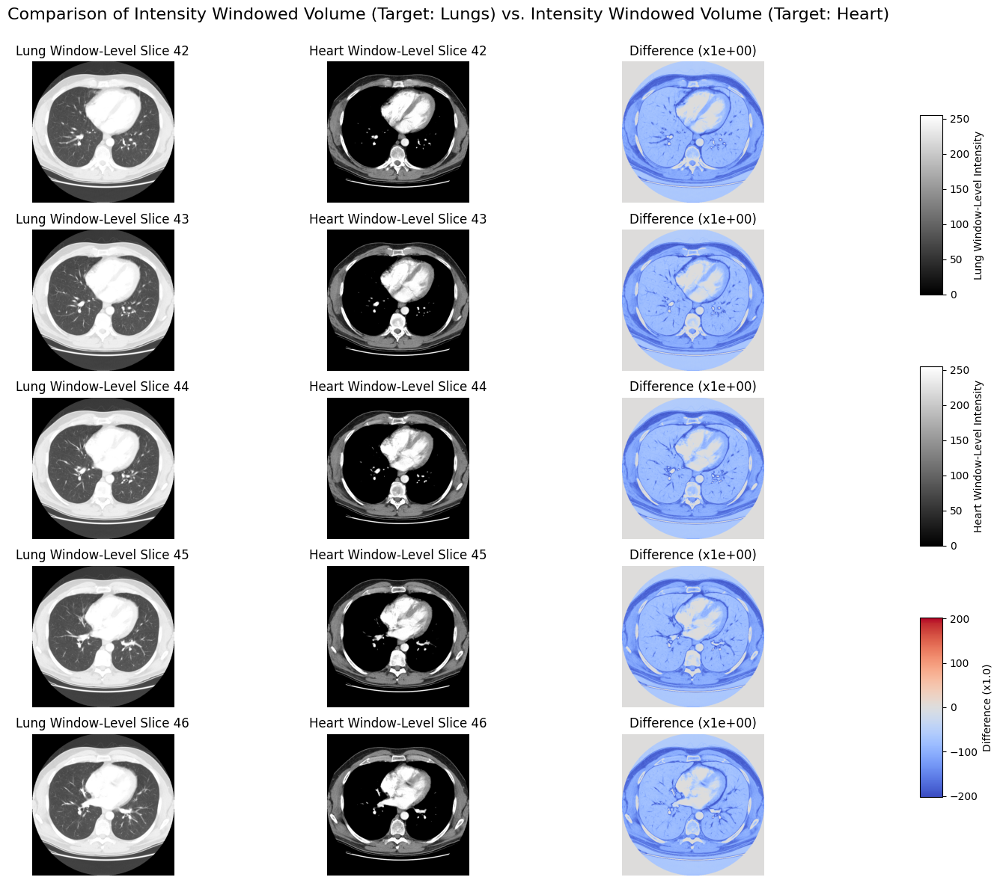

In [21]:
compare_original_with_filtered(intensity_windowed_volume_lung,
                               intensity_windowed_volume_heart,
                               num_slices=5,
                               title='Comparison of Intensity Windowed Volume (Target: Lungs) vs. Intensity Windowed Volume (Target: Heart)',
                               col_1_label="Lung Window-Level",
                               col_2_label="Heart Window-Level")


Observe how we are able to accentuate different anatomical structures by altering our Window and Level parameters. In the Lung filtered image, the heart appears oversaturated and blown-out, while in the Heart filtered image, the lungs are very dark. The difference image shows the detailed structures which differ between the two filtered images.

We will use the Lung Window-Leveled image throughout the remainder of this notebook.

## Median Filter

In [22]:
# Next we will implement a Median Image Filter
def apply_median_filter(image: sitk.Image, radius: Union[int, Tuple[int, int, int]] = 1) -> sitk.Image:
    """
    Apply median filtering to a SimpleITK image.
    Args:
        image: Input image to be filtered
        radius: Radius of the neighborhood. Can be a single integer for all dimension, or a tuple specifying radius for
                each dimension (x, y, z)
    Returns:
        sitk.Image: Filtered image
    """
    # Create the median filter
    median_filter = sitk.MedianImageFilter()

    # Set filter radius
    median_filter.SetRadius(radius)

    # Apply the filter
    filtered_image = median_filter.Execute(image)

    return filtered_image

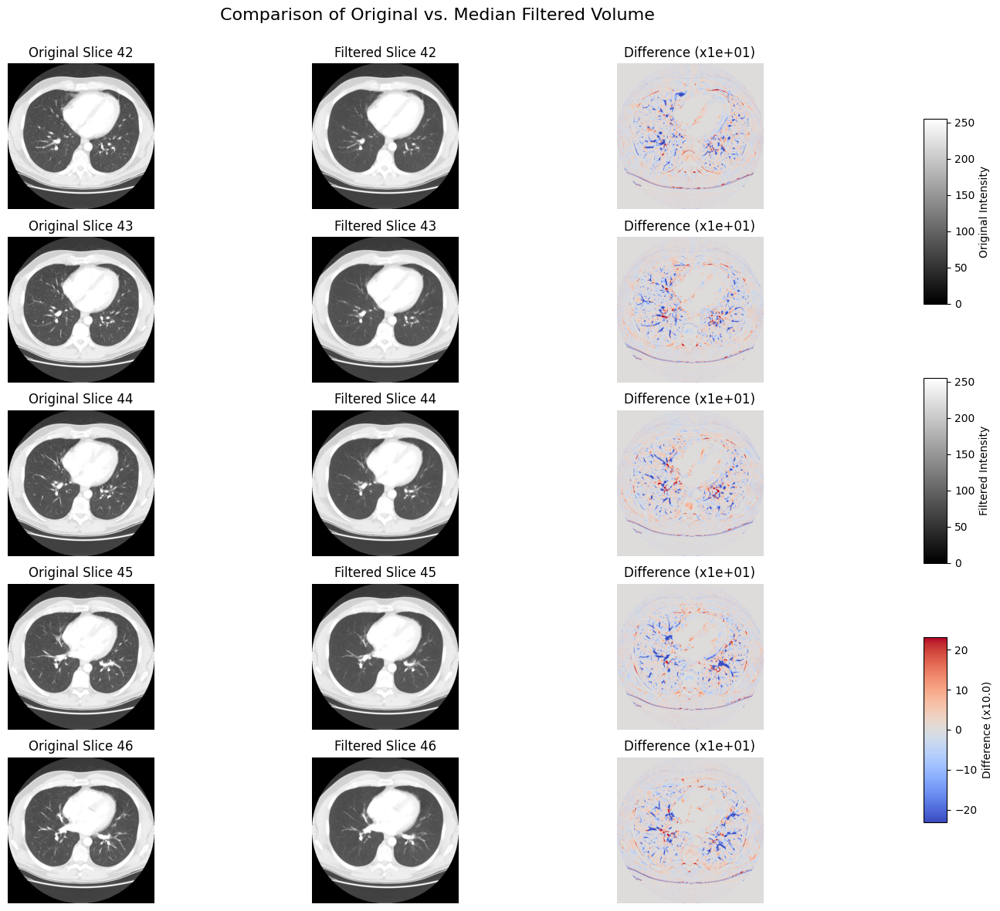

In [23]:
# Apply the filter
median_filtered_volume = apply_median_filter(intensity_windowed_volume_lung)

# Compare and visualize
compare_original_with_filtered(intensity_windowed_volume_lung, median_filtered_volume, num_slices=5, diff_scaling=10.0,
                               title='Comparison of Original vs. Median Filtered Volume')

plt.show()

## Mean Filter

In [24]:
# Mean filtering
def apply_mean_filter(image: sitk.Image, radius: Union[int, Tuple[int, int, int]]=1) -> sitk.Image:
    """
    Apply mean filtering (box filter) to a SimpleITK image.
    This filter replaces each pixel with the mean value of its neighbourhood,
      resulting in smoothing / blurring of the image.
    Args:
        image: Input image to be filtered
        radius: Radius of the neighbourhood. Can be a single integer for all dimensions, or
                a tuple specifying radius for each dimension (x, y, z)
    Returns:
        sitk.Image: Mean filtered image
    """
    # Create the mean filter
    mean_filter = sitk.MeanImageFilter()

    # Set filter radius
    mean_filter.SetRadius(radius)

    # Apply the filter
    filtered_image = mean_filter.Execute(image)

    return filtered_image

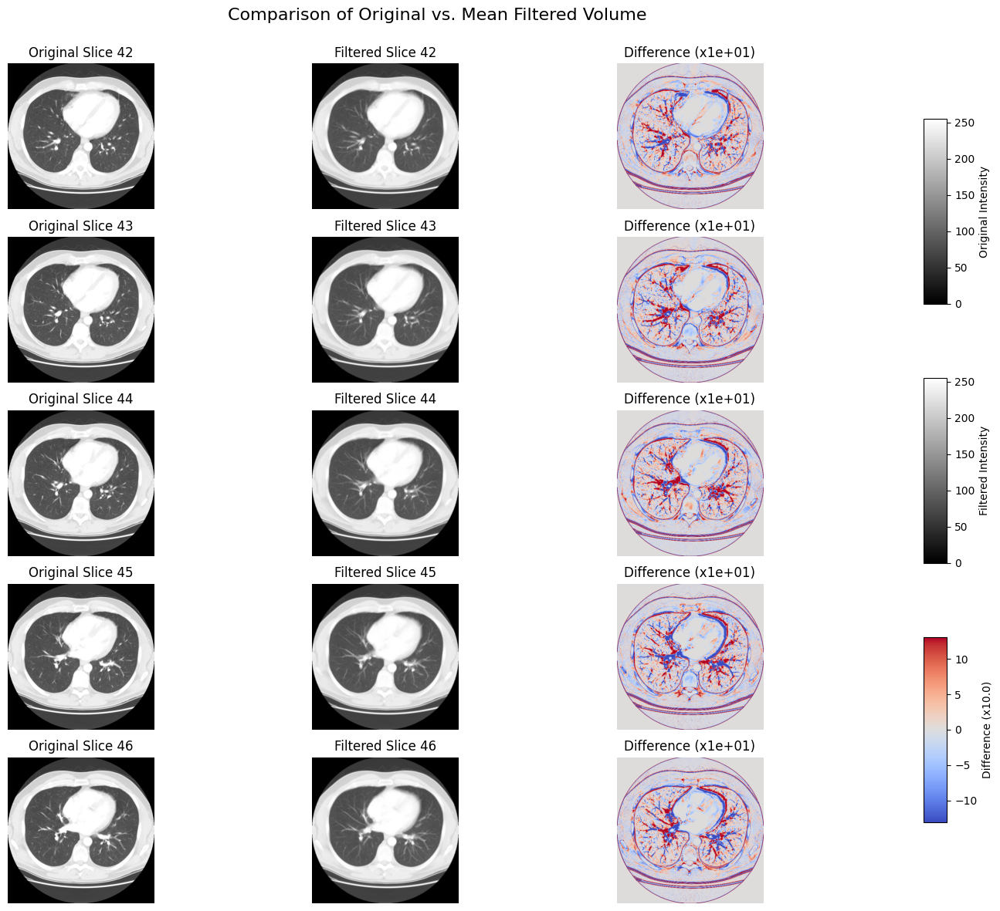

In [25]:
# Apply the filter
mean_filtered_volume = apply_mean_filter(intensity_windowed_volume_lung)

# Compare and visualize
compare_original_with_filtered(intensity_windowed_volume_lung,
                               mean_filtered_volume,
                               num_slices=5,
                               diff_scaling=10.0,
                               title='Comparison of Original vs. Mean Filtered Volume')

plt.show()

## Histogram Equalization Filter

In [26]:
def apply_adaptive_histogram_equalization(image: sitk.Image,
                                          alpha: float=0.3,
                                          beta: float=0.3,
                                          radius: int=5) -> sitk.Image:
    """
    Apply adaptive histogram equalization to a SimpleITK image
    Args:
        image: Input image to be enhanced
        alpha: Controls how much the filter acts like the classical histogram equalization method (alpha=0) or like an unsharp mask (alpha=1)
        beta: Controls how much the filter acts like an unsharp mask (beta=0) or like pass through (beta=1, with alpha=1)
        radius: Neighbourhood radius in pixels for filter
    Returns
        sitk.Image: Histogram equalized image
    """
    # Create the adaptive histogram equalization filter
    ahe_filter = sitk.AdaptiveHistogramEqualizationImageFilter()

    # Set filter parameters
    ahe_filter.SetAlpha(alpha)
    ahe_filter.SetBeta(beta)
    ahe_filter.SetRadius(radius)

    # Apply the filter
    enhanced_image = ahe_filter.Execute(image)

    return enhanced_image

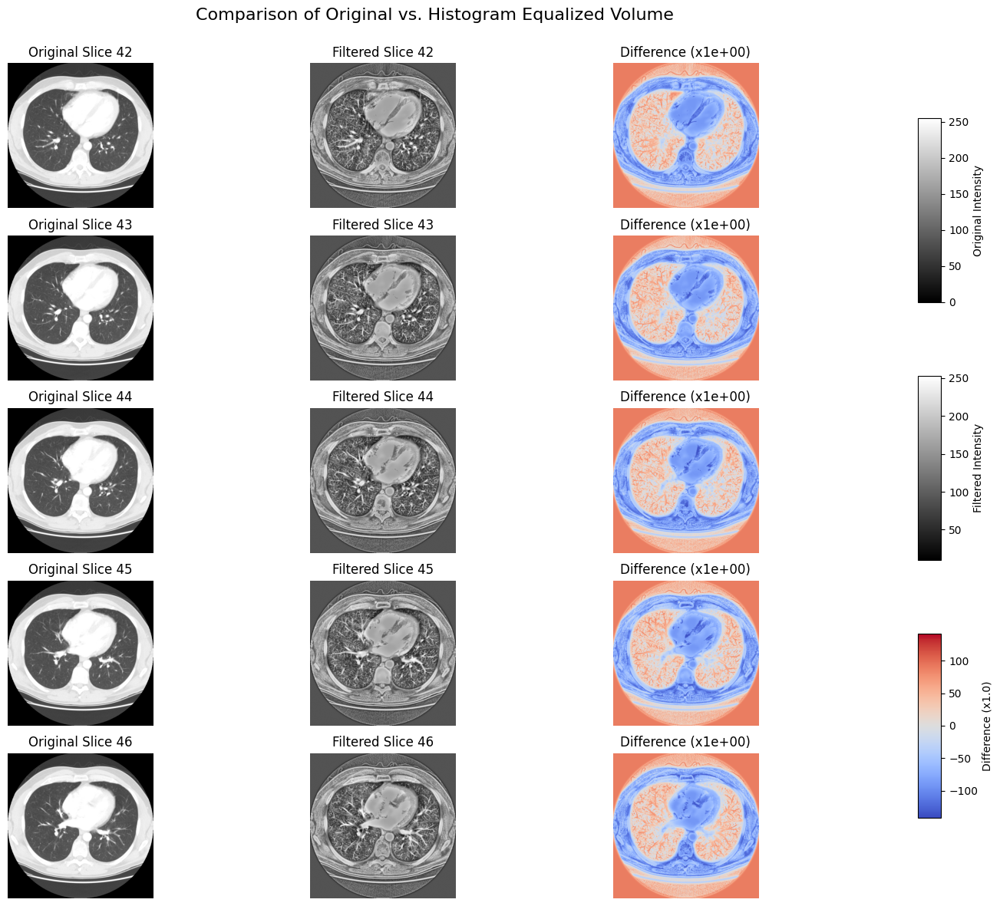

In [27]:
# Apply the filter
histogram_equalized_volume = apply_adaptive_histogram_equalization(intensity_windowed_volume_lung)

# Compare and visualize
compare_original_with_filtered(intensity_windowed_volume_lung,
                               histogram_equalized_volume,
                               num_slices=5,
                               title='Comparison of Original vs. Histogram Equalized Volume')

plt.show()

## Log Filter

In [28]:
# Log filter
def apply_log_filter(image: sitk.Image) -> sitk.Image:
    """
    Apply logarithmic transform filter to a SimpleITK image.
    This filter enhances low-intensity details while compressing high-intensity regions,
    often useful for enhancing details in bright areas.
    In order to properly apply the log filter, we need to shift the image data to ensure all values are positive
    before applying the log transform. After shifting, a small epsilon value is added to avoid log(0) issues.
    Args:
        image: Input image to be filtered
    Returns:
        sitk.Image: Logarithmically filtered image
    """
    # Get image statistics
    stats_filter = sitk.StatisticsImageFilter()
    stats_filter.Execute(image)
    min_value = stats_filter.GetMinimum()
    max_value = stats_filter.GetMaximum()

    print(f"Input image range: [{min_value}, {max_value}]")

    # Calculate offset to make all values positive
    offset = abs(min_value) + 1.0 if min_value <= 0 else 0.0

    # Create shifted image with a small epsilon to avoid log(0)
    shifted_image = sitk.Add(image, offset + 1e-5)

    # Apply log filter
    log_filter = sitk.LogImageFilter()
    logged_image = log_filter.Execute(shifted_image)

    # Get statistics of logged image
    stats_filter.Execute(logged_image)
    log_min = stats_filter.GetMinimum()
    log_max = stats_filter.GetMaximum()

    print(f"Logged image range: [{log_min}, {log_max}]")


    # Use intensity windowing to scale to desired range
    window_filter = sitk.IntensityWindowingImageFilter()
    window_filter.SetWindowMinimum(log_min)
    window_filter.SetWindowMaximum(log_max)
    window_filter.SetOutputMinimum(min_value)
    window_filter.SetOutputMaximum(max_value)

    logged_image = window_filter.Execute(logged_image)

    stats_filter.Execute(logged_image)
    final_min = stats_filter.GetMinimum()
    final_max = stats_filter.GetMaximum()
    print(f"Normalized output range: [{final_min}, {final_max}]")

    return logged_image

Input image range: [0.0, 255.0]
Logged image range: [0.0, 5.0]
Normalized output range: [0.0, 255.0]


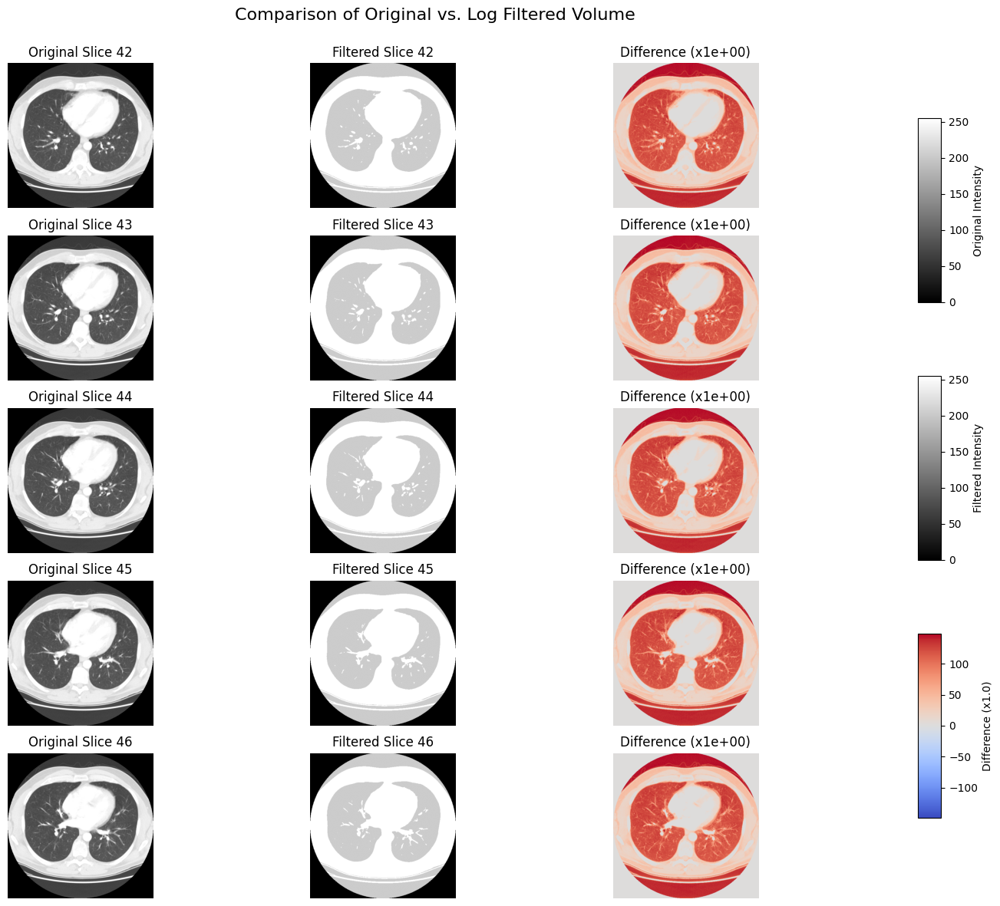

In [29]:
# Here we apply the log filter to our intensity windowed volume from earlier, as it is already in the range [0, 255]
# Apply the filter
log_filtered_volume = apply_log_filter(intensity_windowed_volume_lung)

# Compare and visualize
compare_original_with_filtered(intensity_windowed_volume_lung,
                               log_filtered_volume,
                               num_slices=5,
                               title='Comparison of Original vs. Log Filtered Volume')

plt.show()

## Gradient Magnitude Filter

In [30]:
# Gradient magnitude filter
def apply_gradient_magnitude_filter(image: sitk.Image,
                                    use_image_spacing: bool=True) -> sitk.Image:
    """
    Apply gradient magnitude filter to a SimpleITK image.
    This filter calculates the magnitude of the image gradient at each pixel,
      which highlights edges and boundaries between different structures
    Args:
        image: Input image to be filtered

    Returns:
        sitk.Image: Gradient magnitude image
    """
    # Create the gradient magnitude filter
    gradient_magnitude_filter = sitk.GradientMagnitudeImageFilter()

    # Set whether to use image spacing
    gradient_magnitude_filter.SetUseImageSpacing(use_image_spacing)

    # Apply the filter
    filtered_image = gradient_magnitude_filter.Execute(image)

    return filtered_image

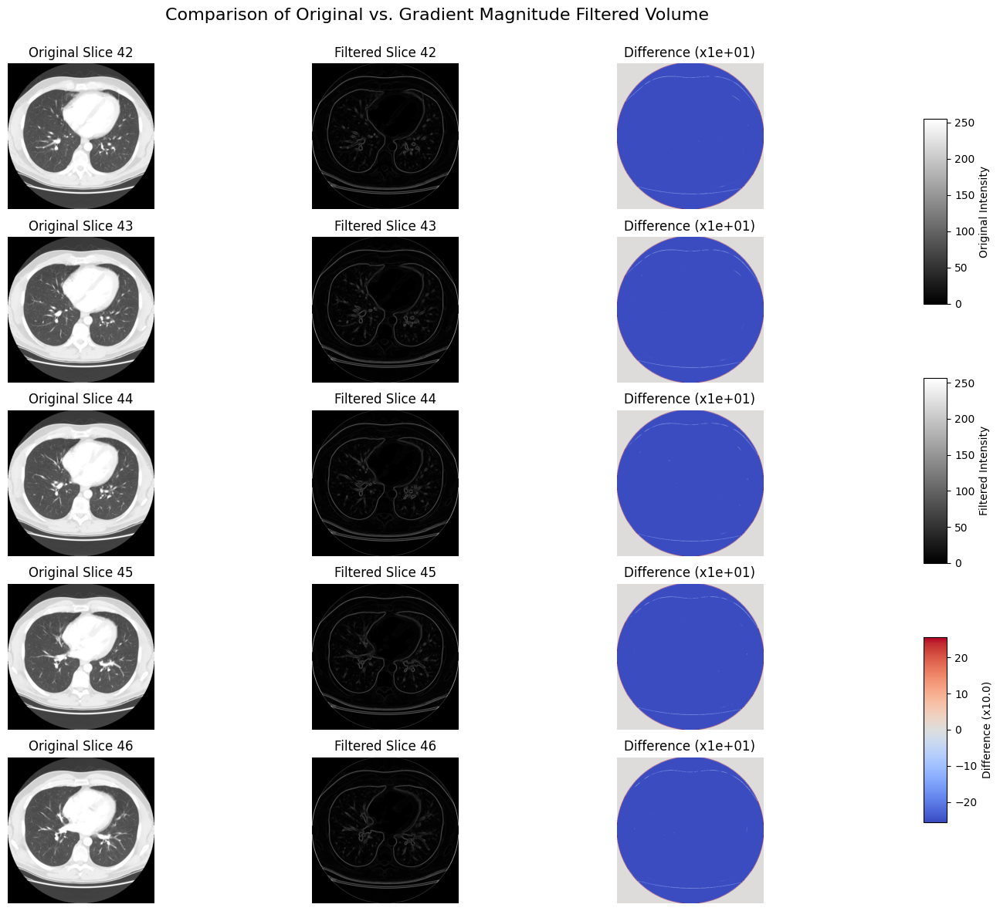

In [31]:
# Apply the filter
gradient_magnitude_filtered_volume = apply_gradient_magnitude_filter(intensity_windowed_volume_lung)

# Compare and visualize
compare_original_with_filtered(intensity_windowed_volume_lung,
                               gradient_magnitude_filtered_volume,
                               num_slices=5,
                               diff_scaling=10.0,
                               title='Comparison of Original vs. Gradient Magnitude Filtered Volume')

plt.show()

## Gradient Magnitude Recursive Gaussian Filter

In [35]:
# In the last block, we implemented a simple Gradient Magnitude Filter. However, image gradients are very susceptible to noise.
# Let's implement a second version which performs Gaussian Smoothing prior to calculating Gradient Magnitude.
# This variation will perform better on noisy input data

def apply_gradient_magnitude_gaussian_filter(image: sitk.Image,
                                             sigma: Union[float, Tuple[float, float, float]]=1.0,
                                             use_image_spacing: bool=True,
                                             normalize_across_scale: bool=False) -> sitk.Image:
    """
    Apply gradient magnitude filter with Gaussian smoothing to a SimpleITK image.
    This filter first performs Gaussian smoothing and then calculates the
      gradient magnitude. It's useful for detecting edges while suppressing noise.
    Args:
        image: Input image to be filtered
        sigma: Standard deviation(s) of the Gaussian smoothing performed before computing the gradient.
                Can be a single float for all dimensions, or a tuple specifying sigma for each dimension (x, y, z)
        use_image_spacing: Whether to use the image's physical spacing in the computation
        normalize_across_scale: Whether to normalize the output across different scales (sigma values)
    Returns:
        sitk.Image: Gradient magnitude image with Gaussian pre-smoothing
    """
    # Check for isotropic sigma (same in all directions)
    if isinstance(sigma, (int, float)):
        # Create the graident magnitude recursive Gaussian filter
        gradient_filter = sitk.GradientMagnitudeRecursiveGaussianImageFilter()
        gradient_filter.SetSigma(sigma)


        # Apply the filter
        filtered_image = gradient_filter.Execute(image)
    else:
        # For non-isotropic sigma, smooth in each direction separately
        smoothed = image
        for i, s in enumerate(sigma):
            if s > 0:
                gaussian_filter = sitk.RecursiveGaussianImageFilter()
                gaussian_filter.SetSigma(s)
                gaussian_filter.SetDirection(i)
                gaussian_filter.SetNormalizeAcrossScale(normalize_across_scale)
                smoothed = gaussian_filter.Execute(smoothed)

        # Then calculate gradient magnitude on the smoothed image
        gradient_filter = sitk.GradientMagnitudeImageFilter()
        gradient_filter.SetUseImageSpacing(use_image_spacing)
        filtered_image = gradient_filter.Execute(smoothed)

    return filtered_image

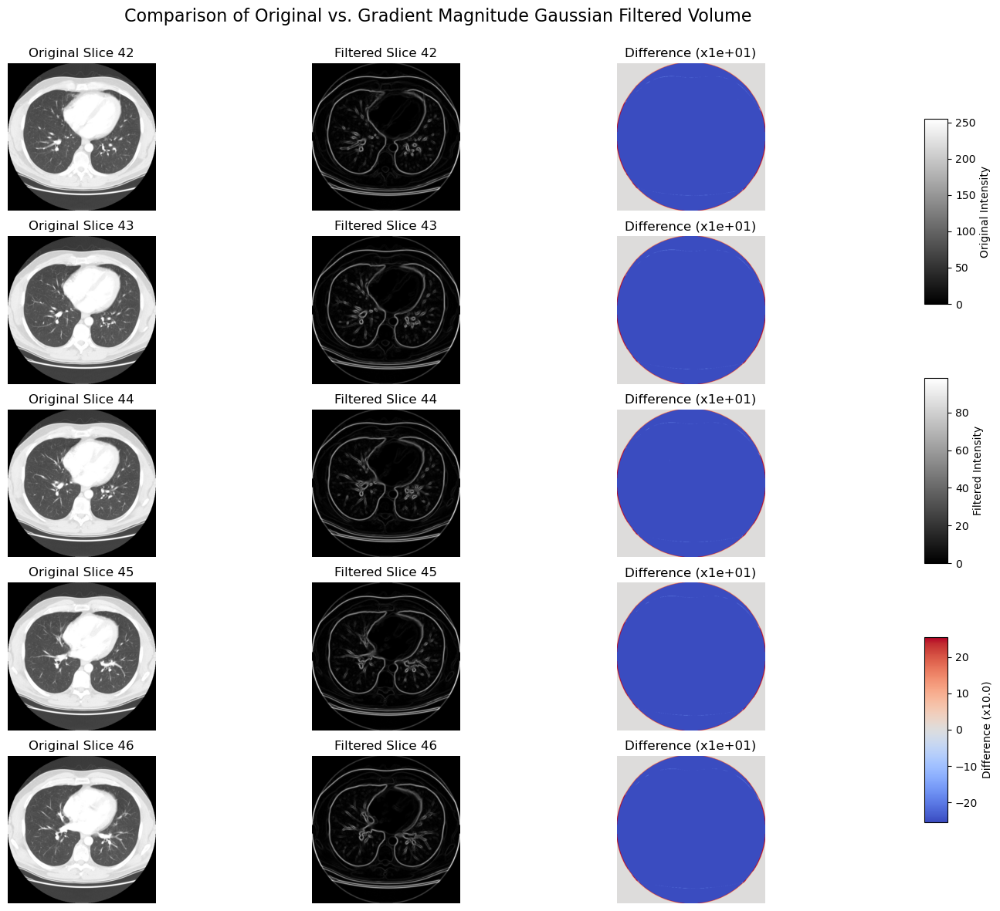

In [36]:
# Apply the filter
gradient_magnitude_gaussian_filtered_volume = apply_gradient_magnitude_gaussian_filter(intensity_windowed_volume_lung)

# Compare and visualize
compare_original_with_filtered(intensity_windowed_volume_lung,
                               gradient_magnitude_gaussian_filtered_volume,
                               num_slices=5,
                               diff_scaling=10.0,
                               title='Comparison of Original vs. Gradient Magnitude Gaussian Filtered Volume')

plt.show()

## Add Gaussian Noise
Here we add Gaussian noise to the image, which will allow us to evaluate how the two variations of the Gradient Magnitude Filter defined above perform on noisy data.

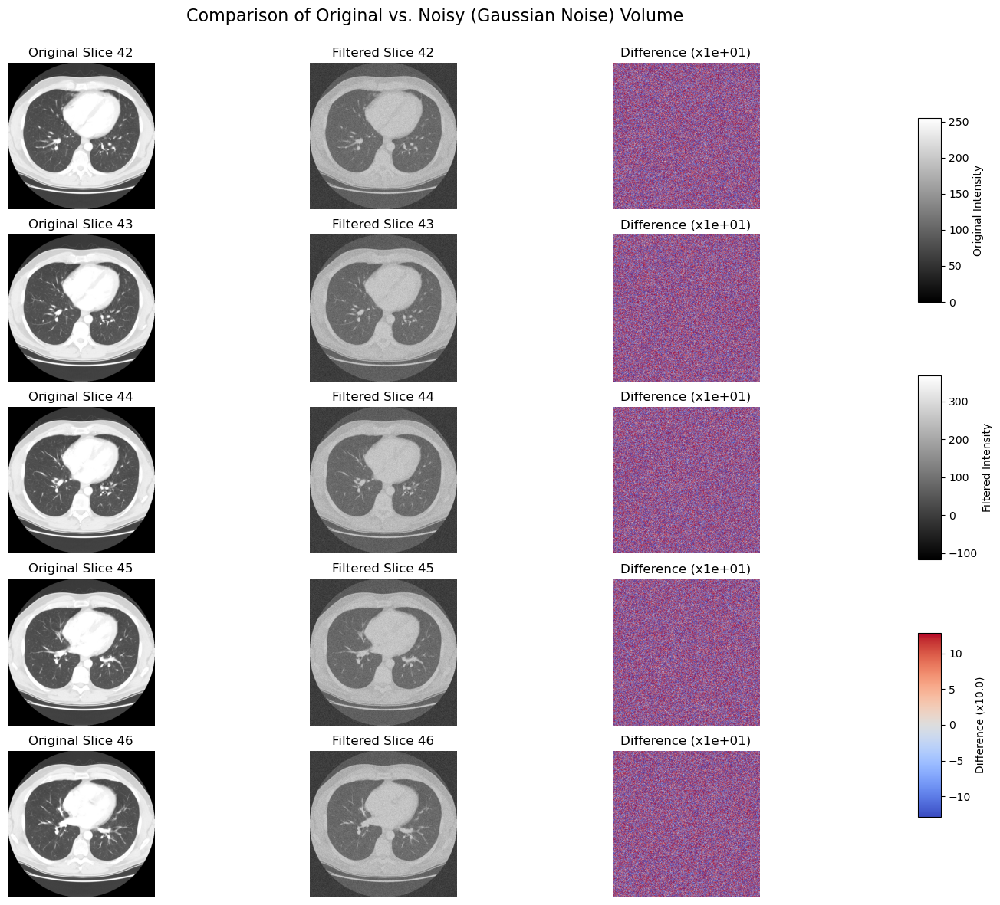

In [42]:
noisy_volume = add_gaussian_noise(intensity_windowed_volume_lung)

# Let's look at the difference between the noisy volume and the original
compare_original_with_filtered(intensity_windowed_volume_lung,
                               noisy_volume,
                               num_slices=5,
                               diff_scaling=10.0,
                               title='Comparison of Original vs. Noisy (Gaussian Noise) Volume')

plt.show()

## Comparison:
### Gradient Magnitude Filter vs. Gradient Magnitude with Gaussian Smoothing Filter on Noisy Data

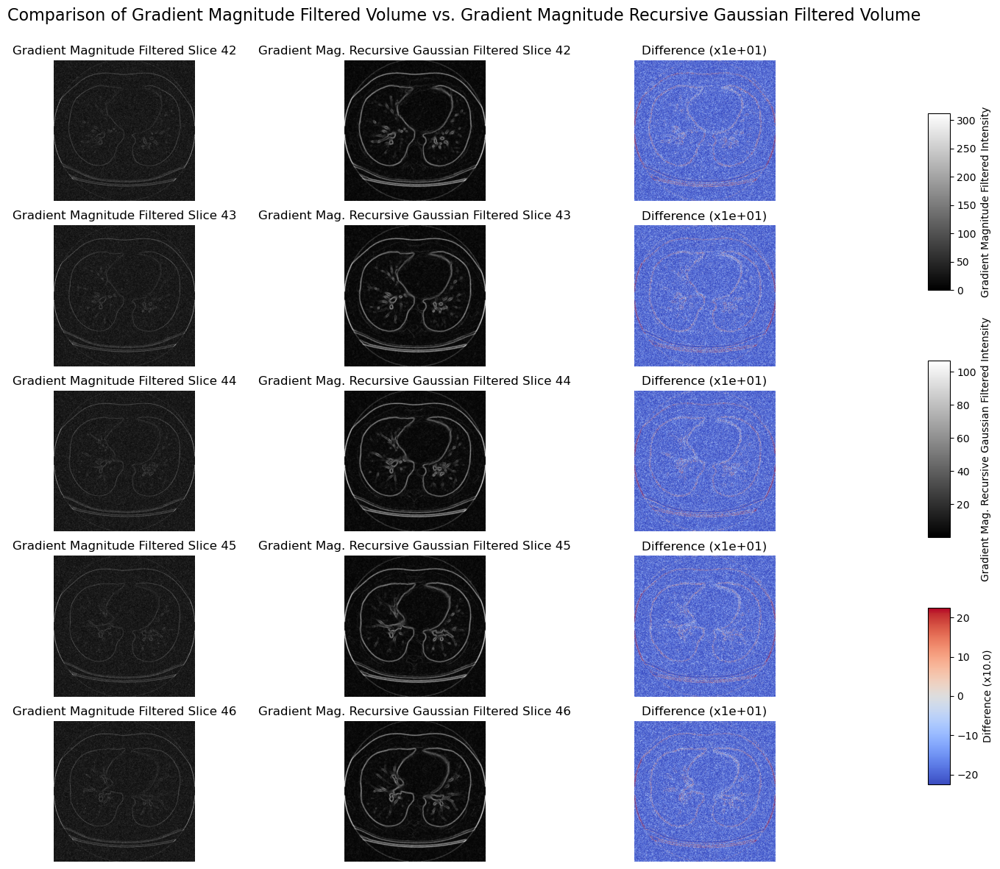

In [44]:
# Apply the Gradient Magnitude filter without Gaussian Smoothing
gradient_magnitude_filtered_volume = apply_gradient_magnitude_filter(noisy_volume)

# Apply the Gradient Magnitude w/ Recursive Gaussian Smoothing filter
gradient_magnitude_gaussian_filtered_volume = apply_gradient_magnitude_gaussian_filter(noisy_volume)

# Compare and visualize
compare_original_with_filtered(gradient_magnitude_filtered_volume,
                               gradient_magnitude_gaussian_filtered_volume,
                               num_slices=5,
                               diff_scaling=10.0,
                               title='Comparison of Gradient Magnitude Filtered Volume vs. Gradient Magnitude Recursive Gaussian Filtered Volume',
                               col_1_label="Gradient Magnitude Filtered",
                               col_2_label="Gradient Mag. Recursive Gaussian Filtered")

plt.show()

The above comparison shows how by performing Gaussian smoothing prior to Gradient Magnitude filtering, we are able to improve the strength of edges in the filtered image. This is important when performing edge detection on noisy images. Edge detection is important for many tasks such as segmentation and registration.

## Next steps

- Try writing functions which implement 3-5 additional filters from the list here: https://simpleitk.readthedocs.io/en/master/filters.html
- Display your results using the provided plotting functions, and try to think of a use case for each filter.
- Write a function to save the filtered images back into DICOM format. Try loading the filtered image in an appropriate viewer

In [40]:
# Add your code here